In [14]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import matplotlib.dates as mdates
import datetime
import psycopg2
pd.options.mode.chained_assignment = None  # default='warn'

In [22]:
columns =   ['trip_id', 'taxi_id text', 'trip_start_timestamp', 'trip_end_timestamp',
             'trip_seconds', 'trip_miles', 'pickup_census_tract', 'dropoff_census_tract', 
             'pickup_community_area', 'dropoff_community_area', 'fare', 'tips',
             'tolls', 'extras', 'trip_total', 'payment_type', 'company', 'pickup_centroid_latitude',
             'pickup_centroid_longitude', 'pickup_centroid_location', 'dropoff_centroid_latitude',
             'dropoff_centroid_longitude', 'dropoff_centroid_location']

In [66]:
def get_connection():
    return psycopg2.connect(host="localhost", database="chicago-taxi-data")

def fetch_db(conn, query, columns=None):
    with get_connection() as conn:
        with conn.cursor() as curs:
            curs.execute(query)
            return pd.DataFrame(curs.fetchall(), columns=columns)

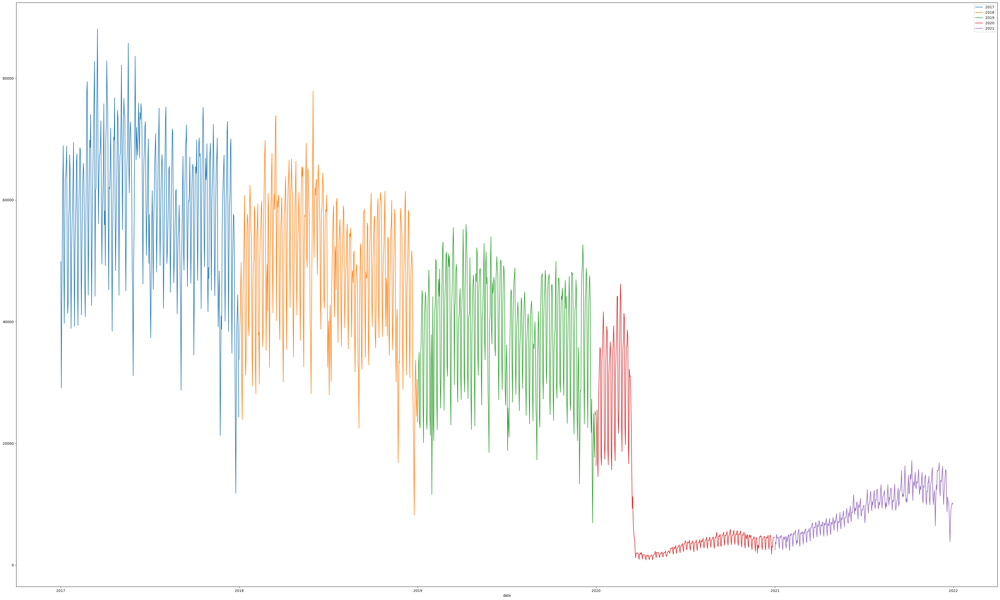

In [83]:
query = "select count(taxi_id), date(trip_start_timestamp), date_part('year', trip_start_timestamp) \
                from cleaned_taxi_trips \
                group by date(trip_start_timestamp)"
count_over_years = fetch_db(conn, query, columns=['count', 'date'])
count_over_years["year"] = count_over_years["date"].apply(lambda x: x.year)

fig, ax = plt.subplots(1, 1, figsize=(50, 30))
for year, df in count_over_years.groupby("year"):
    df.plot(x='date', y='count', ax=ax, label=year)

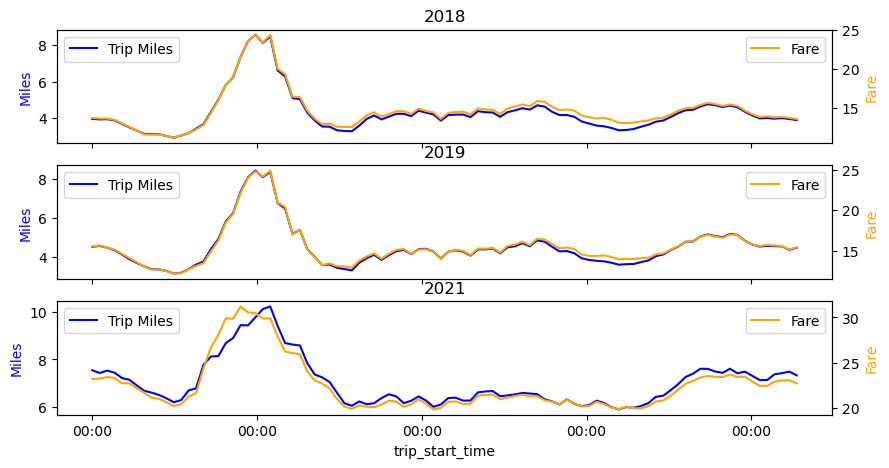

In [134]:
query = "select avg(fare), avg(trip_miles), trip_start_timestamp::time, \
                date_part('year', trip_start_timestamp) \
                from cleaned_taxi_trips \
                group by date_part('year', trip_start_timestamp), trip_start_timestamp::time"

fare_miles_over_years = fetch_db(conn, query, columns=['fare', 'trip_miles', "trip_start_time", "year"])
fare_miles_over_years["fare"] = fare_miles_over_years["fare"].astype('float') 
fare_miles_over_years["trip_miles"] = fare_miles_over_years["trip_miles"].astype('float') 

fig, axes = plt.subplots(3, 1, figsize=(10, 5), sharex=True)

for ax, year in zip(axes, [2018, 2019, 2021]):
        
    df = fare_miles_over_years[fare_miles_over_years["year"] == year]

    df.plot(x="trip_start_time", y="trip_miles", ax=ax, color='blue', label="Trip Miles")
    ax.set_ylabel('Miles', color='blue')
    ax.set_title(year)
    ax.legend(loc=2)

    # Creating twin axes to plot the fare 
    ax2 = ax.twinx()
    df.plot(x="trip_start_time", y="fare", ax=ax2, color='orange', label="Fare")
    ax2.set_ylabel('Fare', color='orange')
    ax2.legend(loc=1)
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))


In [ ]:
query = "select avg(fare), avg(trip_miles), trip_start_timestamp::time, \
                date_part('year', trip_start_timestamp) \
                from cleaned_taxi_trips \
                group by date_part('year', trip_start_timestamp), trip_start_timestamp::time"

fare_miles_over_years = fetch_db(conn, query, columns=['fare', 'trip_miles', "trip_start_time", "year"])
fare_miles_over_years["fare"] = fare_miles_over_years["fare"].astype('float') 
fare_miles_over_years["trip_miles"] = fare_miles_over_years["trip_miles"].astype('float') 


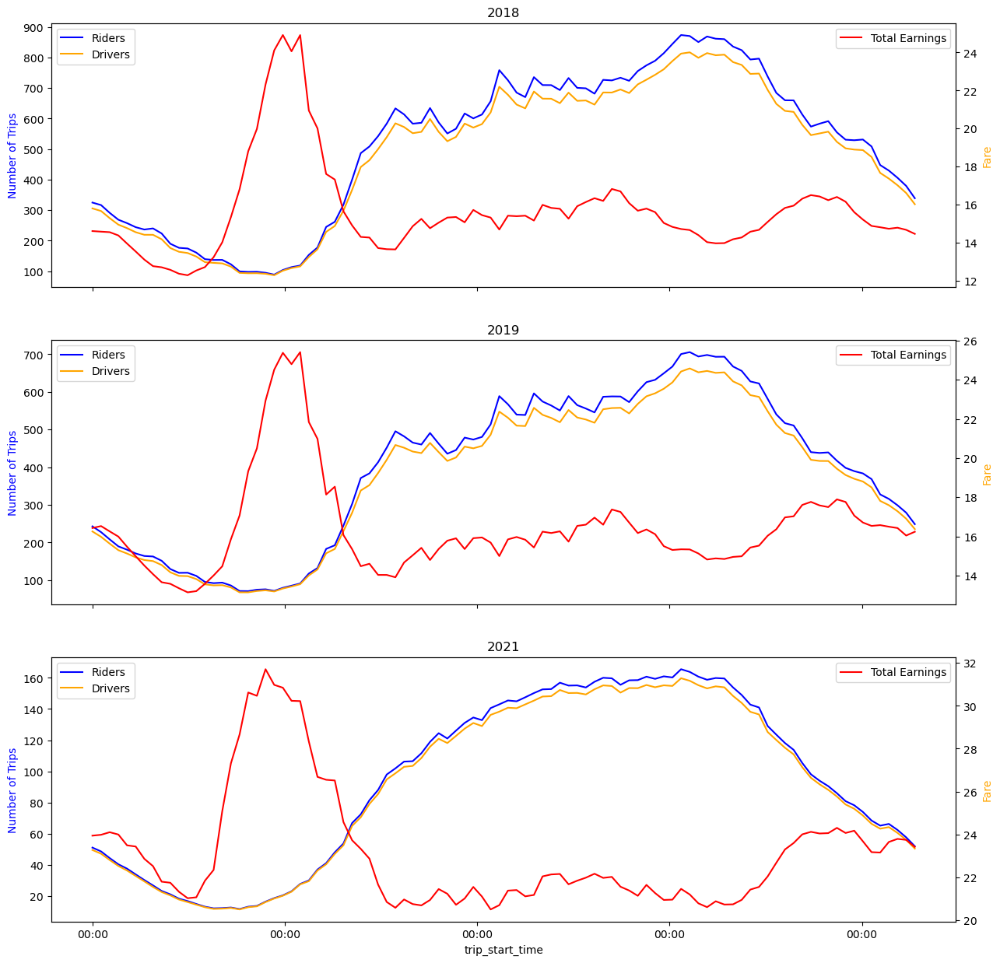

In [159]:
query = "select avg(num_riders), avg(num_drivers), trip_start_timestamp::time, \
             date_part('year', trip_start_timestamp)\
              \
             from \
            (select count(distinct(trip_id)) as num_riders, count(distinct(taxi_id)) \
                as num_drivers, trip_start_timestamp \
                from cleaned_taxi_trips \
                group by trip_start_timestamp) q \
         group by trip_start_timestamp::time, date_part('year', trip_start_timestamp)"

riders_drivers = fetch_db(conn, query, columns=['average_num_rides', 'average_num_drivers', 'trip_start_time',
                                                'year'])
riders_drivers['average_num_drivers'] = riders_drivers['average_num_drivers'].astype('float')
riders_drivers['average_num_rides'] = riders_drivers['average_num_rides'].astype('float')

query = "select avg(total_earning), trip_start_timestamp::time, date_part('year', trip_start_timestamp) from \
            (select sum(fare) as total_earning, trip_start_timestamp \
                from cleaned_taxi_trips group by trip_start_timestamp, taxi_id) q1 \
            group by trip_start_timestamp::time, date_part('year', trip_start_timestamp)"
         
total_fares = fetch_db(conn, query, columns=['Total Earnings', 'trip_start_time', 'year'])
total_fares["Total Earnings"] = total_fares["Total Earnings"].astype('float')

fig, axes = plt.subplots(3, 1, figsize=(15, 15), sharex=True)

for ax, year in zip(axes, [2018, 2019, 2021]):
        
    rider_df = riders_drivers[riders_drivers["year"] == year]

    rider_df.plot(x="trip_start_time", y="average_num_rides", ax=ax, color='blue', label="Riders")
    rider_df.plot(x="trip_start_time", y="average_num_drivers", ax=ax, color='orange', label="Drivers")
    ax.set_ylabel('Number of Trips', color='blue')
    ax.set_title(year)
    ax.legend(loc=2)

    # Creating twin axes to plot the fare 
    ax2 = ax.twinx()
    fare_df= total_fares[total_fares["year"] == year]
    fare_df.plot(x="trip_start_time", y="Total Earnings", ax=ax2, color='red', label="Total Earnings")
    ax2.set_ylabel('Fare', color='orange')
    ax2.legend(loc=1)
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))


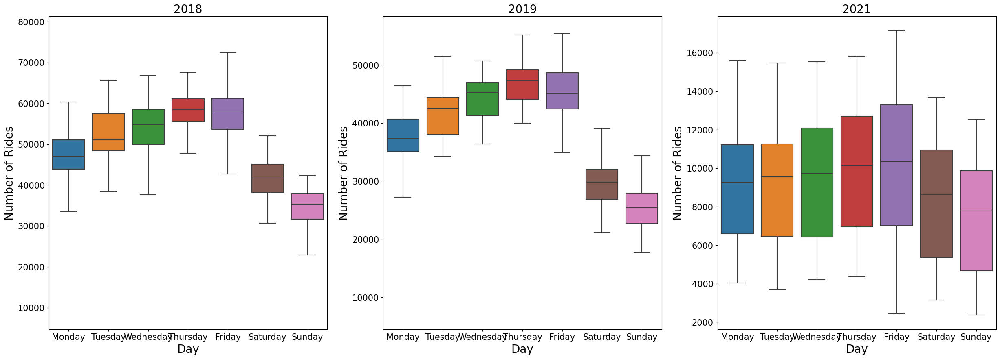

In [201]:
query = "select count(distinct(trip_id)), date_part('isodow', trip_start_timestamp)\
            ,date_part('year', trip_start_timestamp)\
            from cleaned_taxi_trips group by date_part('year', trip_start_timestamp), \
            date(trip_start_timestamp),\
            date_part('isodow', trip_start_timestamp)"
weekday_rides = fetch_db(conn, query, columns=['Number of Rides', 'Weekday', 'Year'])
weekday_dict = {7: 'Sunday', 1: 'Monday', 2:'Tuesday', 3: 'Wednesday', 4: 'Thursday', 5: 'Friday', 6: 'Saturday'}
weekday_rides["Weekday"] = weekday_rides["Weekday"].apply(lambda x: weekday_dict[x])

fig, axes = plt.subplots(1, 3, figsize=(30, 10))
day_orders = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

for year, ax in zip([2018, 2019, 2021], axes):
    obs = weekday_rides[weekday_rides["Year"] == year]

    # Plotting the number of rides for every day of the week 
    sns.boxplot(x="Weekday", y="Number of Rides", data=obs,
                ax=ax, order=day_orders, fliersize=0)
    ax.set_title(year, fontdict={'fontsize': 20})
    ax.set_xlabel("Day")
    ax.set_ylabel('Number of Rides')
    ax.xaxis.label.set_size(20)
    ax.yaxis.label.set_size(20)
    for axis in [ax.xaxis, ax.yaxis]:
        for tick in axis.get_major_ticks():
            tick.label.set_fontsize(15)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


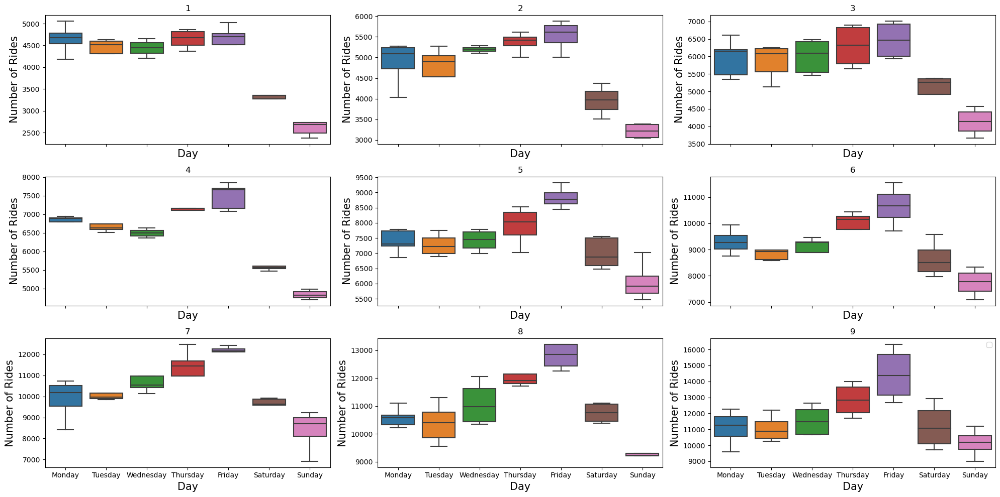

In [218]:
query = "select count(distinct(trip_id)), date_part('isodow', trip_start_timestamp)\
            ,date_part('month', trip_start_timestamp)\
            from cleaned_taxi_trips \
            where date_part('year', trip_start_timestamp) = 2021 \
            group by date_part('month', trip_start_timestamp), \
            date(trip_start_timestamp),\
            date_part('isodow', trip_start_timestamp)"
rides = fetch_db(conn, query, columns=['Number of Rides', 'Weekday', 'Month'])
weekday_dict = {7: 'Sunday', 1: 'Monday', 2:'Tuesday', 3: 'Wednesday', 4: 'Thursday', 5: 'Friday', 6: 'Saturday'}
rides["Weekday"] = rides["Weekday"].apply(lambda x: weekday_dict[x])

# Plotting the  number of rides for each day of the week for the first 9 months of 2021

fig, axes = plt.subplots(3, 3, figsize=(20, 10), sharex=True)
day_orders = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
k = 1
for i in range(3):
    for j in range(3):
        ax = axes[i][j]
        sns.boxplot(x="Weekday", y="Number of Rides", 
                    data=rides[rides["Month"] == k], 
                    ax=ax, order=day_orders, fliersize=0)
        ax.set_ylabel('Trip Numbers')
        ax.set_title(k, fontdict={'fontsize': 12})
        ax.set_xlabel("Day")
        ax.set_ylabel('Number of Rides')
        ax.xaxis.label.set_size(15)
        ax.yaxis.label.set_size(15)
        for axis in [ax.xaxis, ax.yaxis]:
            for tick in axis.get_major_ticks():
                tick.label.set_fontsize(10)
        k += 1

plt.legend()
plt.tight_layout()

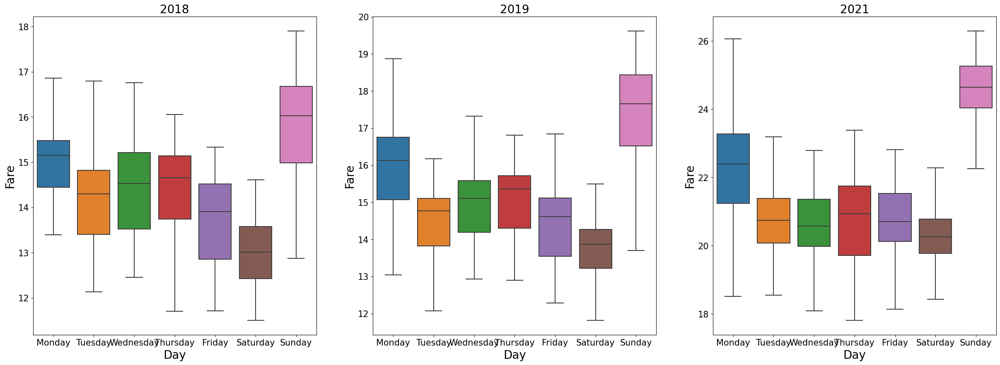

In [206]:
query = "select avg(fare), date_part('isodow', trip_start_timestamp)\
            ,date_part('year', trip_start_timestamp)\
            from cleaned_taxi_trips group by date_part('year', trip_start_timestamp), \
            date(trip_start_timestamp),\
            date_part('isodow', trip_start_timestamp)"
weekday_fares = fetch_db(conn, query, columns=['Fare', 'Weekday', 'Year'])
weekday_dict = {7: 'Sunday', 1: 'Monday', 2:'Tuesday', 3: 'Wednesday', 4: 'Thursday', 5: 'Friday', 6: 'Saturday'}
weekday_fares["Weekday"] = weekday_fares["Weekday"].apply(lambda x: weekday_dict[x])
weekday_fares["Fare"] = weekday_fares["Fare"].astype('float')

fig, axes = plt.subplots(1, 3, figsize=(30, 10))
day_orders = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

for year, ax in zip([2018, 2019, 2021], axes):
    
    obs = weekday_fares[weekday_fares["Year"] == year]

    # Plotting the number of rides for every day of the week 
    sns.boxplot(x="Weekday", y="Fare", data=obs,
                ax=ax, order=day_orders, fliersize=0)
    ax.set_title(year, fontdict={'fontsize': 20})
    ax.set_xlabel("Day")
    ax.set_ylabel('Fare')
    ax.xaxis.label.set_size(20)
    ax.yaxis.label.set_size(20)
    for axis in [ax.xaxis, ax.yaxis]:
        for tick in axis.get_major_ticks():
            tick.label.set_fontsize(15)

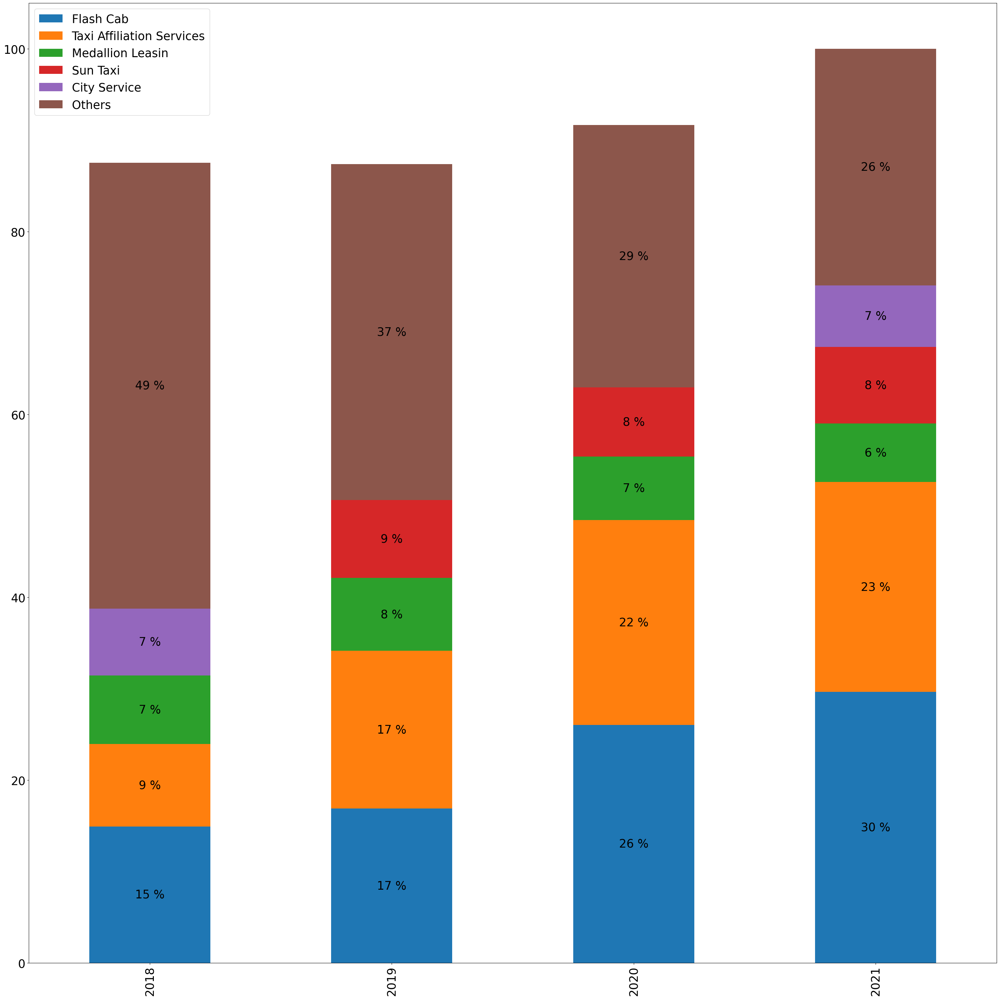

In [224]:
query = "select count(distinct(trip_id)), company, date_part('year', trip_start_timestamp) \
            from cleaned_taxi_trips group by date_part('year', trip_start_timestamp), \
            company"
company_rides = fetch_db(conn, query, columns=['Number of Rides', 'Company', 'Year'])

all_years = []
all_companies = []
all_percentages = []

companies = {}
top_n = 5
for year in [2018, 2019, 2020, 2021]:
    obs = company_rides[company_rides["Year"] == year]

    # Counting the number of rides per company for each year
    companies, rides = obs["Company"].values, obs['Number of Rides'].values
    companies, rides = companies[np.argsort(-rides)], rides[np.argsort(-rides)]

    # Selecting the top_n rides and labelling the rest as others

    companies = np.append(companies[:top_n], ["Others"])
    rides = np.append(rides[:top_n], [np.sum(rides[top_n:])])
    rides = rides * 100 / np.sum(rides)
    
    # Appending the list of companies and their percentage market shares 

    all_companies.append(companies)
    all_years.append(np.repeat(year, len(companies)))
    all_percentages.append(rides)

all_years = np.concatenate(all_years)
all_companies = np.concatenate(all_companies)
all_percentages = np.concatenate(all_percentages)

fig, ax = plt.subplots(1, 1, figsize=(30, 30))
company_df = {}
order = ['Flash Cab', 'Taxi Affiliation Services', 'Medallion Leasin', 'Sun Taxi', 
         'City Service', 'Others']

# Manipulating the market share data so as to have the company names as the columns
# This is required in order for us to have a stacked bar plots

for company in np.unique(all_companies):
    company_df[company] = {}

for year, company, pct in zip(all_years, all_companies, all_percentages):
    company_df[company][year] = pct
company_df = pd.DataFrame(company_df)[order]
company_df.plot(kind='bar', stacked=True, ax=ax)


# Adjusting the axes labels and fontsizes

font_size = 25


for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy()
    if height > 0:
        ax.text(x+width/2, 
                y+height/2, 
                '{:.0f} %'.format(height), 
                horizontalalignment='center', 
                verticalalignment='center', fontdict={'fontsize': font_size})

ax.xaxis.label.set_size(font_size)
ax.yaxis.label.set_size(font_size)

plt.setp(ax.get_legend().get_texts(), fontsize='{}'.format(font_size))

for axis in [ax.xaxis, ax.yaxis]:
    for tick in axis.get_major_ticks():
        tick.label.set_fontsize(font_size)
        
ax.legend(loc='best', prop={'size': font_size})
plt.tight_layout()

Seems like pre-covid the market shares in 2018 are distributed more evenly as evidenced by the collective market shares of smaller taxi companies and as the year progresses they consolidate to a couple of big companies. It is worth noting that the consolidation seems to be sped up during the height of the pandemic and lastly in 2021, most of the market shares of the smaller companies seem to go to Flash Cab and Taxi Affiliation Services. Let's take a look at the trend of payment type changes across these companies

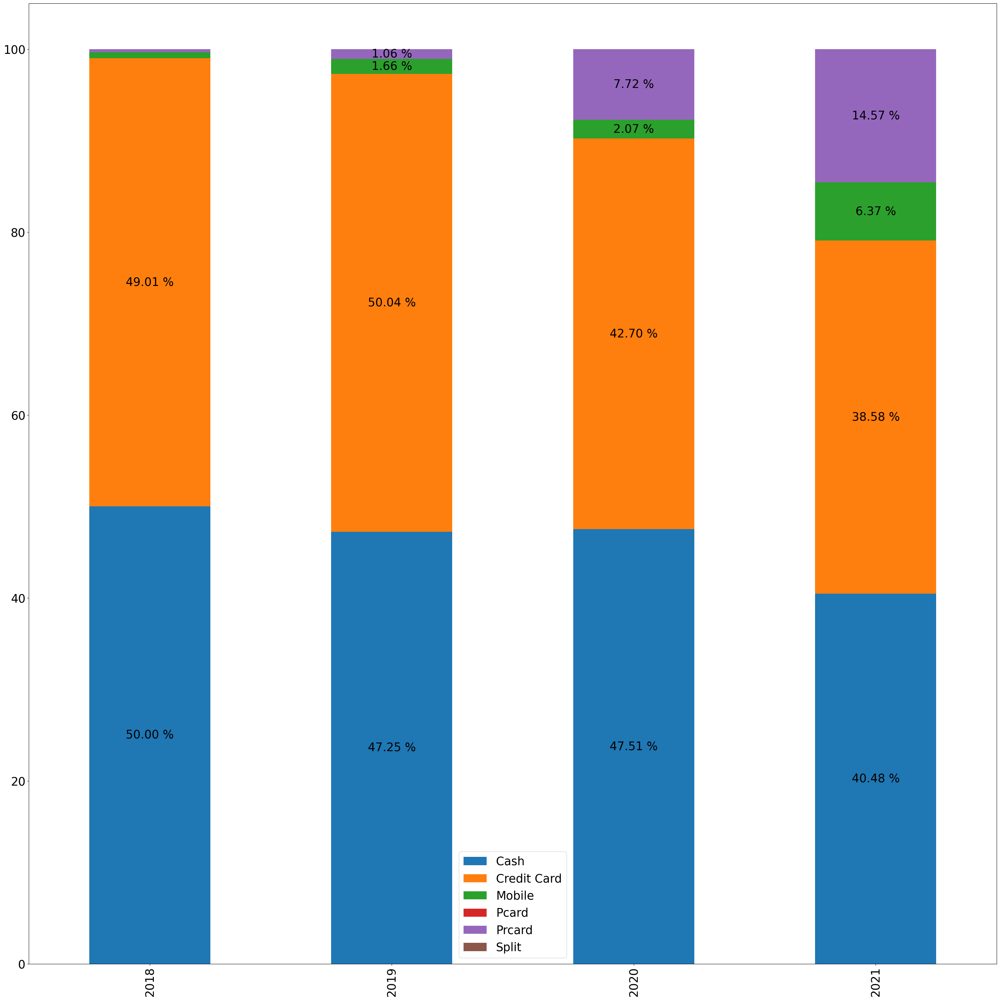

In [229]:
query = "select count(distinct(trip_id)), payment_type, date_part('year', trip_start_timestamp) \
            from cleaned_taxi_trips group by date_part('year', trip_start_timestamp), \
            payment_type"
payment_rides = fetch_db(conn, query, columns=['Number of Rides', 'Payment Type', 'Year'])

all_payments = []
all_years = []
all_percentages = []

for year in [2018, 2019, 2020, 2021]:
    obs = payment_rides[payment_rides["Year"] == year]
    obs = obs[~obs["Payment Type"].isin(['Dispute', 'No Charge', 'Unknown'])]
    payments, counts = obs["Payment Type"].values, obs["Number of Rides"].values
    counts = counts * 100 / np.sum(counts)
    
    all_payments.extend(payments)
    all_years.extend(np.repeat(year, len(payments)))
    all_percentages.extend(counts)
    

fig, ax = plt.subplots(1, 1, figsize=(30, 30))
payment_df = {}

# Manipulating the market share data so as to have the company names as the columns
# This is required in order for us to have a stacked bar plots

for payment in np.unique(all_payments):
    payment_df[payment] = {}

for year, payment, pct in zip(all_years, all_payments, all_percentages):
    payment_df[payment][year] = pct
    
payment_df = pd.DataFrame(payment_df)
payment_df.plot(kind='bar', stacked=True, ax=ax)

font_size = 25

for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy()
    if height > 1:
        ax.text(x+width/2, 
                y+height/2, 
                '{:.2f} %'.format(height), 
                horizontalalignment='center', 
                verticalalignment='center', fontdict={'fontsize': font_size})

ax.xaxis.label.set_size(font_size)
ax.yaxis.label.set_size(font_size)

plt.setp(ax.get_legend().get_texts(), fontsize='{}'.format(font_size))

for axis in [ax.xaxis, ax.yaxis]:
    for tick in axis.get_major_ticks():
        tick.label.set_fontsize(font_size)
        
ax.legend(loc='best', prop={'size': font_size})
plt.tight_layout()

In [230]:
query = "select count(distinct(trip_id)), payment_type, company, date_part('year', trip_start_timestamp) \
            from cleaned_taxi_trips group by date_part('year', trip_start_timestamp), \
            payment_type, company"
payment_company_rides = fetch_db(conn, query, columns=['Number of Rides', 'Payment Type', 'Company', 'Year'])
payment_company_rides["Year"] = payment_company_rides["Year"].astype('int')

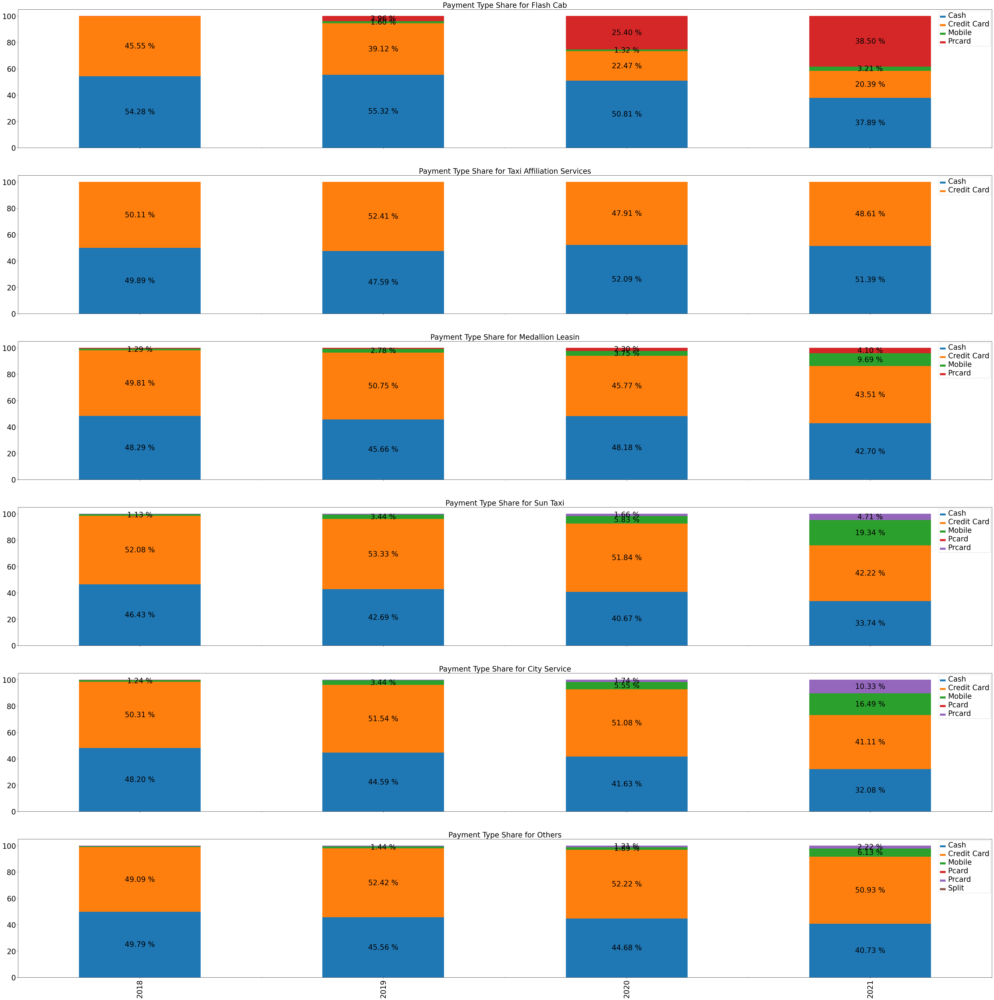

In [271]:
def normalize_payment_count(df):
    df["Payment Share"] = df["Number of Rides"] / df["Number of Rides"].sum()
    return df

companies = ['Flash Cab', 'Taxi Affiliation Services', 'Medallion Leasin', 'Sun Taxi', 
             'City Service']

payment_df = []
for year in [2018, 2019, 2020, 2021]:
    obs = payment_company_rides[payment_company_rides["Year"] == year]
    obs = obs[~obs["Payment Type"].isin(['Dispute', 'No Charge', 'Unknown'])]
    obs.loc[~obs["Company"].isin(companies), "Company"] = 'Others'
    obs = obs.groupby(["Company", "Payment Type", "Year"]).sum().reset_index()
    payment_df.append(obs.groupby('Company').apply(normalize_payment_count))
    
payment_df = pd.concat(payment_df)

companies.append('Others')

fig, axes = plt.subplots(6, 1, figsize=(60, 60), sharex=True)
for company, ax in zip(companies, axes):
    all_payments = payment_df[payment_df["Company"] ==  company]["Payment Type"].unique()
    sub_payment = {ptype: [] for ptype in all_payments
                   }
    for year in [2018, 2019, 2020, 2021]:
        sub_df = payment_df[(payment_df["Company"] == company) & (payment_df["Year"] == year)]
        ptype_count = {ptype: count for ptype, count in zip(sub_df["Payment Type"], 
                                                            sub_df["Payment Share"])}
        for ptype in all_payments:
            if ptype in ptype_count:
                sub_payment[ptype].append(ptype_count[ptype] * 100)
            else:
                sub_payment[ptype].append(0)
                
    sub_payment = pd.DataFrame(sub_payment)
    sub_payment.index = [2018, 2019, 2020, 2021]
    sub_payment.plot(kind='bar', stacked=True, ax=ax)

    font_size = 25

    for p in ax.patches:
        width, height = p.get_width(), p.get_height()
        if height > 1:
            x, y = p.get_xy()
            ax.text(x+width/2, 
                    y+height/2, 
                    '{:.2f} %'.format(height), 
                    horizontalalignment='center', 
                    verticalalignment='center', fontdict={'fontsize': font_size})

        ax.xaxis.label.set_size(font_size)
        ax.yaxis.label.set_size(font_size)
        ax.set_title('Payment Type Share for {}'.format(company), fontdict={'fontsize': font_size})
        plt.setp(ax.get_legend().get_texts(), fontsize='{}'.format(font_size))

        for axis in [ax.xaxis, ax.yaxis]:
            for tick in axis.get_major_ticks():
                tick.label.set_fontsize(font_size)

#         ax.legend(loc='best', prop={'size': font_size})


# handles, labels = ax.get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper center')

In [272]:
import matplotlib
import geopandas as gpd

In [273]:
# Loading map of chicago

ca = gpd.read_file("./chicago_map.geojson")
ca['area_num_1'] = ca['area_num_1'].astype('int')

In [276]:
pickup_query = "select count(distinct(trip_id)), avg(fare), pickup_community_area,\
                    date_part('hour', trip_start_timestamp), date_part('year', trip_start_timestamp)\
                    from cleaned_taxi_trips \
                    group by pickup_community_area, \
                             date_part('hour', trip_start_timestamp),\
                             date_part('year', trip_start_timestamp)"

dropoff_query = "select count(distinct(trip_id)), avg(fare), dropoff_community_area, \
                    date_part('hour', trip_start_timestamp), date_part('year', trip_start_timestamp) \
                    from cleaned_taxi_trips \
                    group by dropoff_community_area, \
                             date_part('hour', trip_start_timestamp),\
                             date_part('year', trip_start_timestamp)"

pickup_by_hour = fetch_db(conn, pickup_query, columns=['Number of Rides', 'Fare', 'Area', 'Hour', 
                                                'Year'])
dropoff_by_hour = fetch_db(conn, dropoff_query, columns=['Number of Rides', 'Fare', 'Area', 'Hour', 
                                                 'Year'])

In [ ]:
pickup_by_hour = pickup_by_hour.dropna()
pickup_by_hour = ca.merge(pickup_by_hour, left_on='area_num_1', right_on="pickup_community_area")
pickup_by_hour["center"] = pickup_by_hour["geometry"].to_crs(crs=4326).centroid
pickup_by_hour.fillna(value = 0, inplace=True)

In [290]:
dropoff_by_hour = dropoff_by_hour.dropna()
dropoff_by_hour = ca.merge(dropoff_by_hour, left_on='area_num_1', right_on="dropoff_community_area")
dropoff_by_hour["center"] = dropoff_by_hour["geometry"].to_crs(crs=4326).centroid
dropoff_by_hour.fillna(value = 0, inplace=True)

/home/christopher/miniconda3/envs/taxi_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  This is separate from the ipykernel package so we can avoid doing imports until


In [311]:
def visualize_community_trip_by_hour(df, hours, col, year=2021, title='pickup'):
    df = df[df["Year"] == year]
    fig, axes = plt.subplots(1, len(hours), figsize=(20, 10 * len(hours)))
    for hour, ax in zip(hours, axes):
        to_plot = df[df["Hour"] == hour]

        # Plotting the heatmap for each district
        
        to_plot.plot(column=col, scheme='fisher_jenks', cmap='YlOrRd', 
                          edgecolor='black',
                          legend=True, ax=ax)

        # Annotating the district 
        for idx, row in to_plot.iterrows():
            ax.annotate(row['area_num_1'], (row['center'].x, row['center'].y),
                        horizontalalignment='center')
        ax.set_title('{} Distribution at {} hour for the year of {}'.format(title, hour, year), fontdict={'fontsize': 12})
    plt.tight_layout()


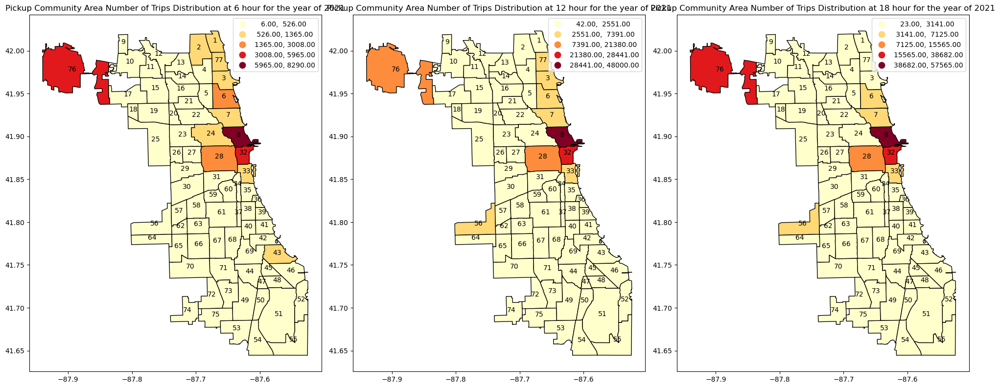

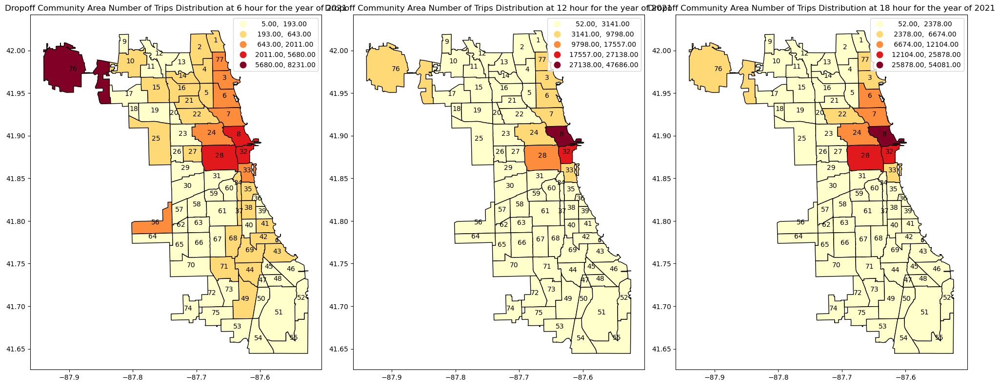

In [313]:
hours = [6, 12, 18]
year = 2021
visualize_community_trip_by_hour(pickup_by_hour, hours, 'Number of Rides', year, 'Pickup Community Area Number of Trips')
visualize_community_trip_by_hour(dropoff_by_hour, hours, 'Number of Rides', year, 'Dropoff Community Area Number of Trips')


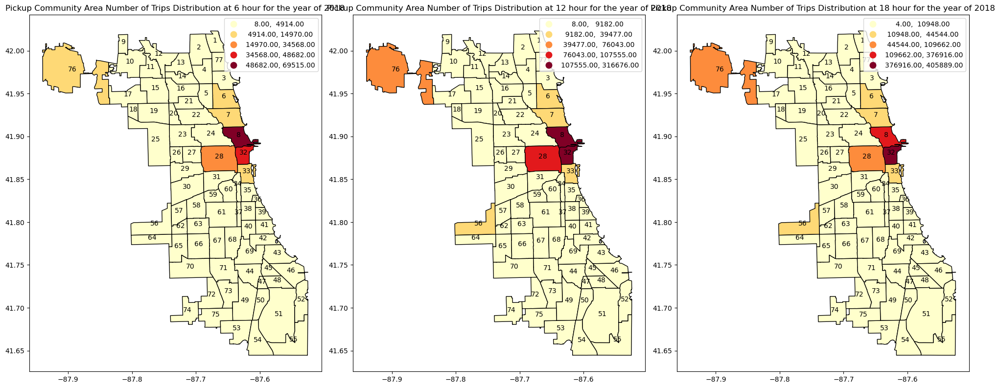

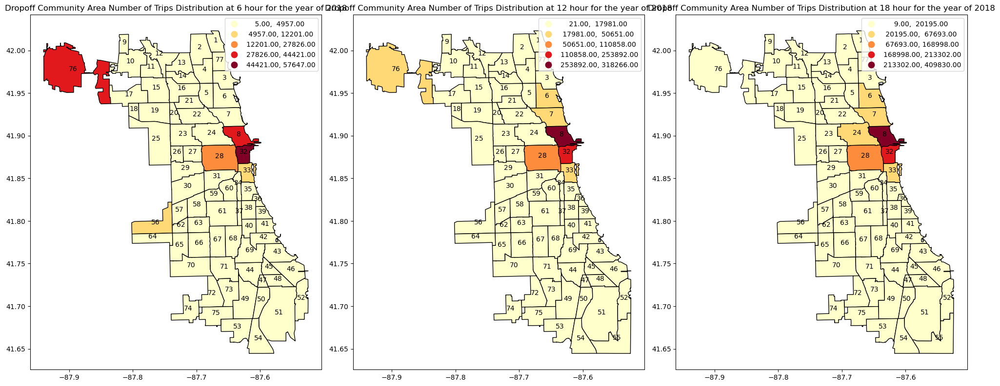

In [315]:
hours = [6, 12, 18]
year = 2018
visualize_community_trip_by_hour(pickup_by_hour, hours, 'Number of Rides', year, 'Pickup Community Area Number of Trips')
visualize_community_trip_by_hour(dropoff_by_hour, hours, 'Number of Rides', year, 'Dropoff Community Area Number of Trips')


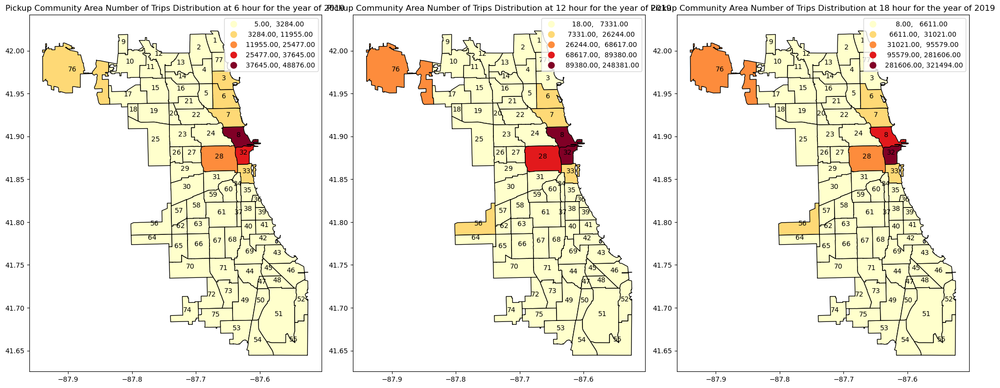

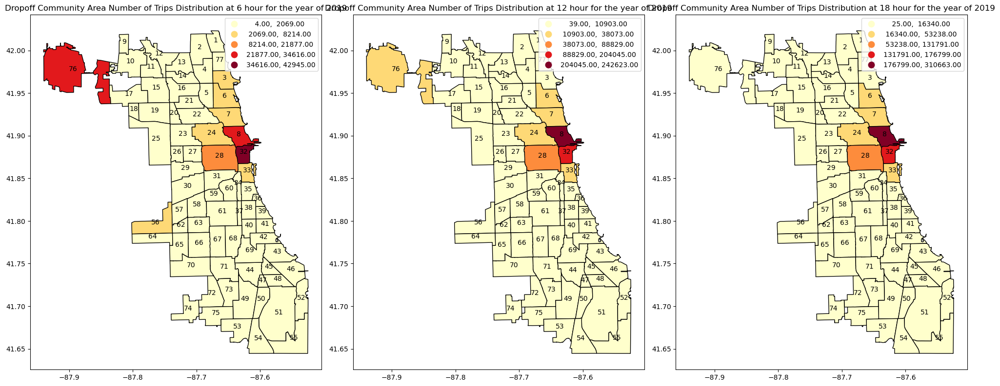

In [316]:
hours = [6, 12, 18]
year = 2019
visualize_community_trip_by_hour(pickup_by_hour, hours, 'Number of Rides', year, 'Pickup Community Area Number of Trips')
visualize_community_trip_by_hour(dropoff_by_hour, hours, 'Number of Rides', year, 'Dropoff Community Area Number of Trips')


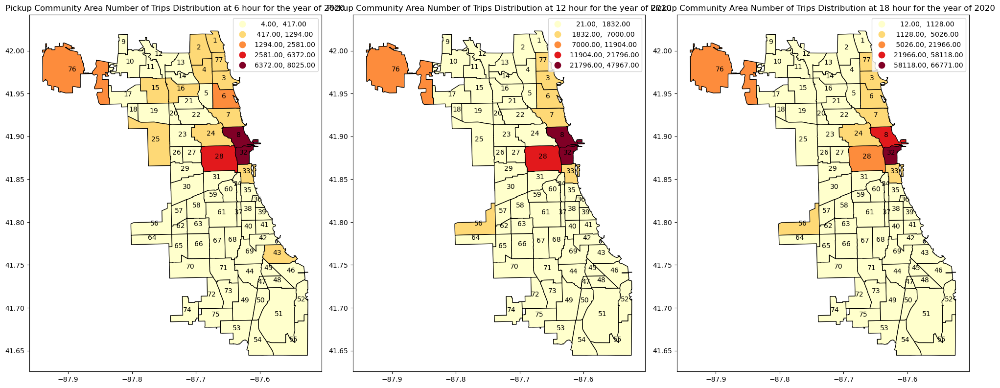

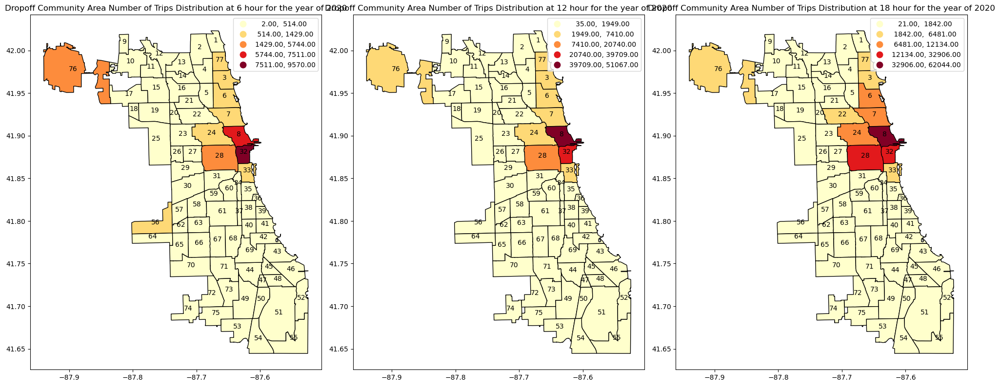

In [317]:
hours = [6, 12, 18]
year = 2020
visualize_community_trip_by_hour(pickup_by_hour, hours, 'Number of Rides', year, 'Pickup Community Area Number of Trips')
visualize_community_trip_by_hour(dropoff_by_hour, hours, 'Number of Rides', year, 'Dropoff Community Area Number of Trips')


Next we visualize the average Fare

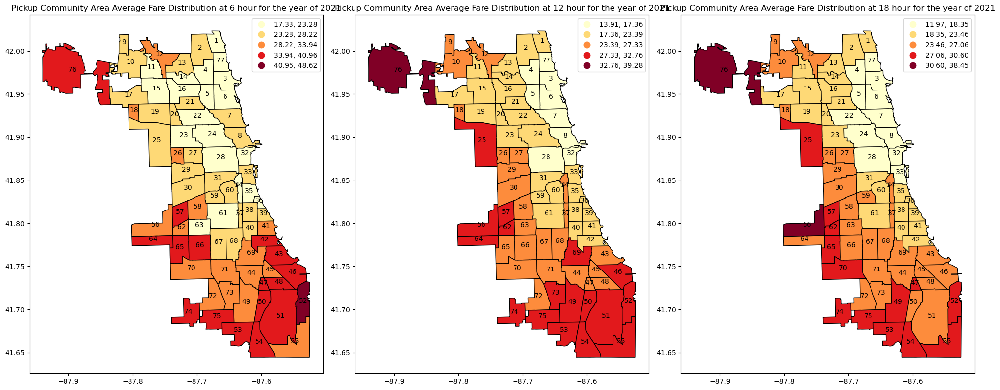

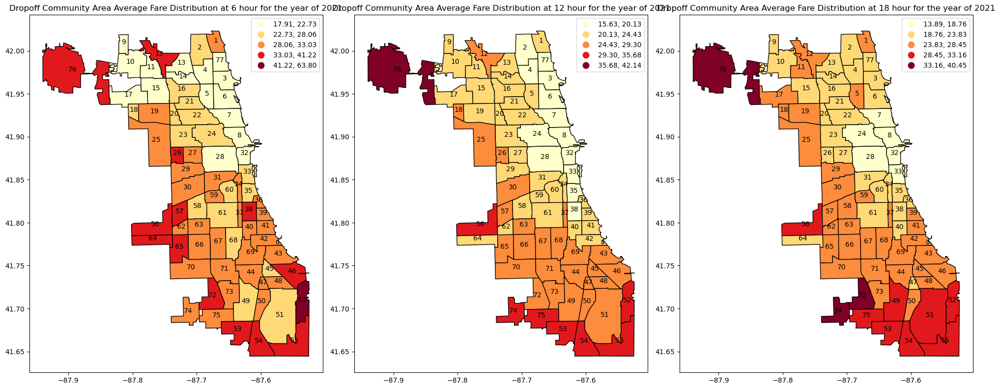

In [318]:
hours = [6, 12, 18]

year = 2021
visualize_community_trip_by_hour(pickup_by_hour, hours, 'Fare', year, 'Pickup Community Area Average Fare')
visualize_community_trip_by_hour(dropoff_by_hour, hours, 'Fare', year, 'Dropoff Community Area Average Fare')


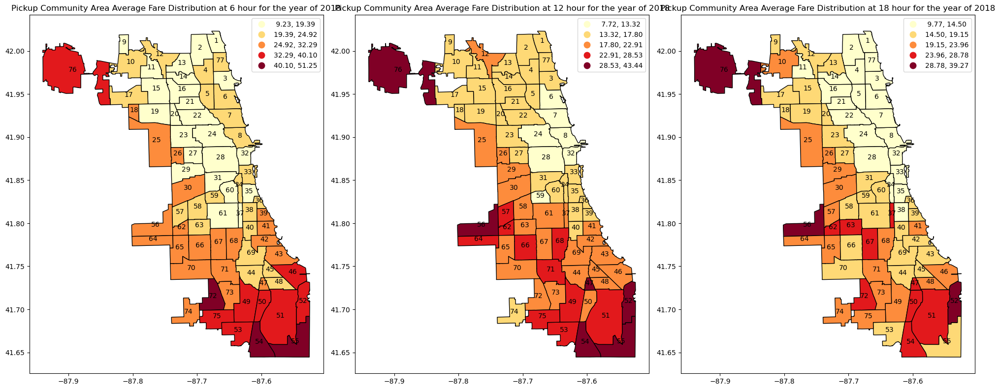

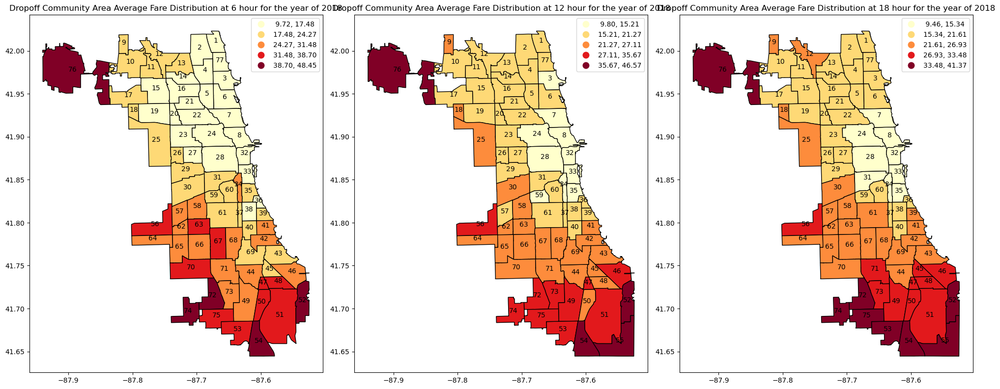

In [319]:
hours = [6, 12, 18]

year = 2018
visualize_community_trip_by_hour(pickup_by_hour, hours, 'Fare', year, 'Pickup Community Area Average Fare')
visualize_community_trip_by_hour(dropoff_by_hour, hours, 'Fare', year, 'Dropoff Community Area Average Fare')


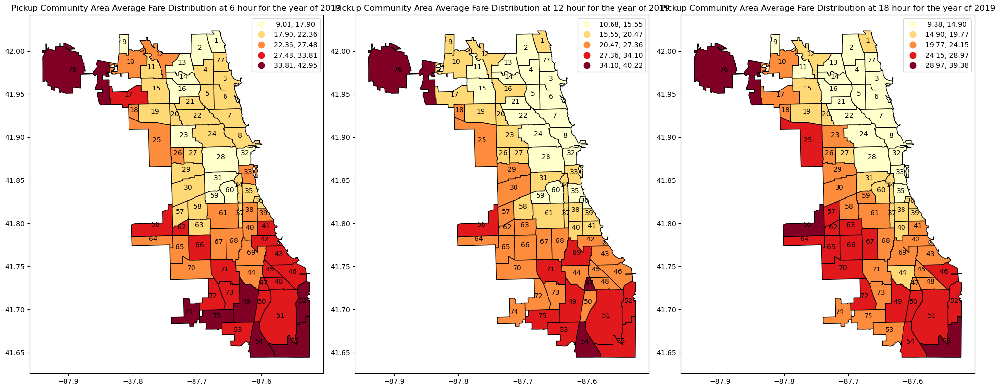

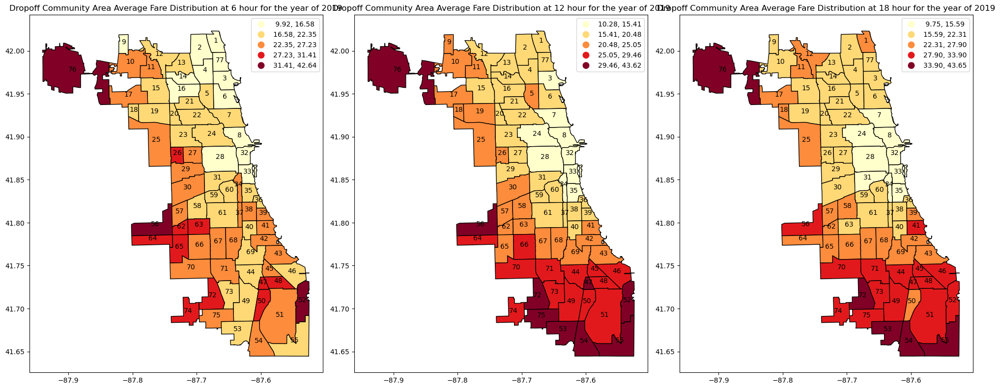

In [320]:
hours = [6, 12, 18]

year = 2019
visualize_community_trip_by_hour(pickup_by_hour, hours, 'Fare', year, 'Pickup Community Area Average Fare')
visualize_community_trip_by_hour(dropoff_by_hour, hours, 'Fare', year, 'Dropoff Community Area Average Fare')


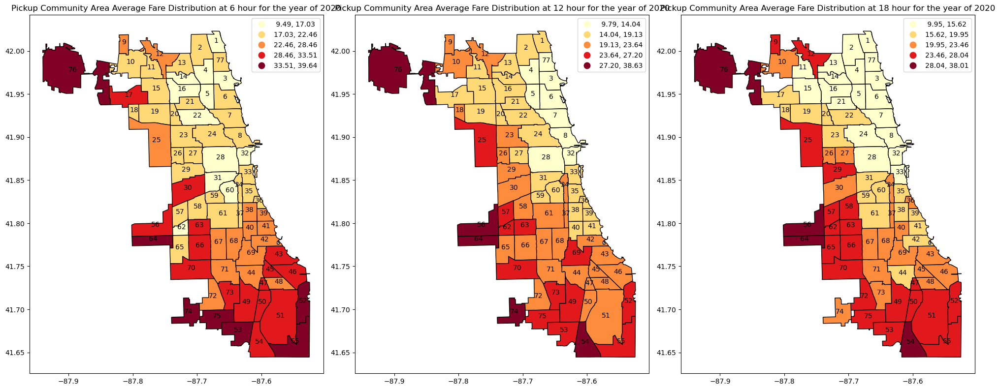

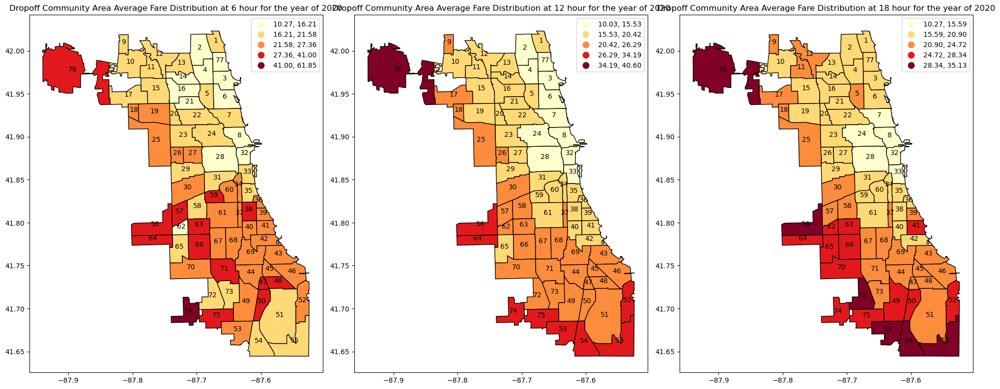

In [321]:
hours = [6, 12, 18]

year = 2020
visualize_community_trip_by_hour(pickup_by_hour, hours, 'Fare', year, 'Pickup Community Area Average Fare')
visualize_community_trip_by_hour(dropoff_by_hour, hours, 'Fare', year, 'Dropoff Community Area Average Fare')
